# British Airways Predictive Analysis using `RandomForest`

This program uses predictive analysis to determine the predicted number of bookings for a certain period of time.

## Import dependencies

In [67]:
import pandas as pd

## Loading the data

The dataset is consists of the following columns:
- `num_passengers`: The number of passengers being booked
- `sales_channel`: The mode of payment used
- `trip_type`: The type of trip
- `purchase_lead`: The number of days between the booking and the flight
- `length_of_stay`: The number of days between the departure and the arrival
- `flight_hour`: The hour of the flight
- `flight_day`: The day of the flight
- `route`: The route of the flight
- `booking_origin`: The origin of the booking
- `wants_extra_baggage`: Whether the passenger wants extra baggage
- `wants_preferred_seat`: Whether the passenger wants a preferred seat
- `wants_in_flight_meals`: Whether the passenger wants an inflight meal
- `flight_duration`: The duration of the flight
- `booking_completed`: Whether the booking was completed (predictive column)


In [2]:
booking = pd.read_csv('data/customer_booking.csv', encoding='ISO-8859-1')
booking.head()

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,Sat,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,Sat,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,Wed,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,Sat,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,Wed,AKLDEL,India,1,0,1,5.52,0


In [3]:
booking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   num_passengers         50000 non-null  int64  
 1   sales_channel          50000 non-null  object 
 2   trip_type              50000 non-null  object 
 3   purchase_lead          50000 non-null  int64  
 4   length_of_stay         50000 non-null  int64  
 5   flight_hour            50000 non-null  int64  
 6   flight_day             50000 non-null  object 
 7   route                  50000 non-null  object 
 8   booking_origin         50000 non-null  object 
 9   wants_extra_baggage    50000 non-null  int64  
 10  wants_preferred_seat   50000 non-null  int64  
 11  wants_in_flight_meals  50000 non-null  int64  
 12  flight_duration        50000 non-null  float64
 13  booking_complete       50000 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.3+ 

## Feature extraction

Dummy features were created to prepare the dataset for model creation. Those dummies that have less occurrence were dropped to make the dataset more efficient when fitting into the model.

In [4]:
booking['sales_channel'] = booking['sales_channel'].astype('category')

In [5]:
booking['sales_channel'].value_counts()

sales_channel
Internet    44382
Mobile       5618
Name: count, dtype: int64

In [6]:
booking = pd.get_dummies(booking, columns=['sales_channel'], prefix='sales_channel')

In [7]:
booking.head()

,num_passengers,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,sales_channel_Internet,sales_channel_Mobile
0,2,RoundTrip,262,19,7,Sat,AKLDEL,New Zealand,1,0,0,5.52,0,True,False
1,1,RoundTrip,112,20,3,Sat,AKLDEL,New Zealand,0,0,0,5.52,0,True,False
2,2,RoundTrip,243,22,17,Wed,AKLDEL,India,1,1,0,5.52,0,True,False
3,1,RoundTrip,96,31,4,Sat,AKLDEL,New Zealand,0,0,1,5.52,0,True,False
4,2,RoundTrip,68,22,15,Wed,AKLDEL,India,1,0,1,5.52,0,True,False


In [8]:
booking['trip_type'] = booking['trip_type'].astype('category')

In [9]:
booking['trip_type'].value_counts()

trip_type
RoundTrip     49497
OneWay          387
CircleTrip      116
Name: count, dtype: int64

In [10]:
booking = pd.get_dummies(booking, columns=['trip_type'], prefix='trip_type')
booking.head()

,num_passengers,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,sales_channel_Internet,sales_channel_Mobile,trip_type_CircleTrip,trip_type_OneWay,trip_type_RoundTrip
0,2,262,19,7,Sat,AKLDEL,New Zealand,1,0,0,5.52,0,True,False,False,False,True
1,1,112,20,3,Sat,AKLDEL,New Zealand,0,0,0,5.52,0,True,False,False,False,True
2,2,243,22,17,Wed,AKLDEL,India,1,1,0,5.52,0,True,False,False,False,True
3,1,96,31,4,Sat,AKLDEL,New Zealand,0,0,1,5.52,0,True,False,False,False,True
4,2,68,22,15,Wed,AKLDEL,India,1,0,1,5.52,0,True,False,False,False,True


In [11]:
booking['flight_day'] = booking['flight_day'].astype('category')
booking['flight_day'].value_counts()

flight_day
Mon    8102
Wed    7674
Tue    7673
Thu    7424
Fri    6761
Sun    6554
Sat    5812
Name: count, dtype: int64

In [12]:
booking = pd.get_dummies(booking, columns=['flight_day'], prefix='flight_day')
booking.head()

,num_passengers,purchase_lead,length_of_stay,flight_hour,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,...,trip_type_CircleTrip,trip_type_OneWay,trip_type_RoundTrip,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed
0,2,262,19,7,AKLDEL,New Zealand,1,0,0,5.52,...,False,False,True,False,False,True,False,False,False,False
1,1,112,20,3,AKLDEL,New Zealand,0,0,0,5.52,...,False,False,True,False,False,True,False,False,False,False
2,2,243,22,17,AKLDEL,India,1,1,0,5.52,...,False,False,True,False,False,False,False,False,False,True
3,1,96,31,4,AKLDEL,New Zealand,0,0,1,5.52,...,False,False,True,False,False,True,False,False,False,False
4,2,68,22,15,AKLDEL,India,1,0,1,5.52,...,False,False,True,False,False,False,False,False,False,True


In [13]:
booking['route'] = booking['route'].astype('category')
booking['route'].value_counts()

route
AKLKUL    2680
PENTPE     924
MELSGN     842
ICNSIN     801
DMKKIX     744
          ... 
BDOWUH       1
CNXXIY       1
MELNRT       1
CNXDEL       1
URTXIY       1
Name: count, Length: 799, dtype: int64

In [16]:
booking = pd.get_dummies(booking, columns=['route'], prefix='route')

In [18]:
booking.head()

,num_passengers,purchase_lead,length_of_stay,flight_hour,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,...,route_TGGXIY,route_TPETRZ,route_TPETWU,route_TPEURT,route_TPEVTE,route_TRZWUH,route_TRZXIY,route_TWUWUH,route_TWUXIY,route_URTXIY
0,2,262,19,7,New Zealand,1,0,0,5.52,0,...,False,False,False,False,False,False,False,False,False,False
1,1,112,20,3,New Zealand,0,0,0,5.52,0,...,False,False,False,False,False,False,False,False,False,False
2,2,243,22,17,India,1,1,0,5.52,0,...,False,False,False,False,False,False,False,False,False,False
3,1,96,31,4,New Zealand,0,0,1,5.52,0,...,False,False,False,False,False,False,False,False,False,False
4,2,68,22,15,India,1,0,1,5.52,0,...,False,False,False,False,False,False,False,False,False,False


In [19]:
booking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Columns: 821 entries, num_passengers to route_URTXIY
dtypes: bool(811), float64(1), int64(8), object(1)
memory usage: 42.5+ MB


In [20]:
#iterate through columns and find and remove all dummies that have less than 100 True values
for column in booking.columns:
    if booking[column].dtype == 'bool':
        if booking[column].sum() < 100:
            booking.drop(column, axis=1, inplace=True)

In [21]:
booking.head()

,num_passengers,purchase_lead,length_of_stay,flight_hour,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,...,route_PENTPE,route_PERPNH,route_PERSGN,route_PERTPE,route_PNHSYD,route_PUSSIN,route_SBWTPE,route_SGNSYD,route_SYDTPE,route_SYDTRZ
0,2,262,19,7,New Zealand,1,0,0,5.52,0,...,False,False,False,False,False,False,False,False,False,False
1,1,112,20,3,New Zealand,0,0,0,5.52,0,...,False,False,False,False,False,False,False,False,False,False
2,2,243,22,17,India,1,1,0,5.52,0,...,False,False,False,False,False,False,False,False,False,False
3,1,96,31,4,New Zealand,0,0,1,5.52,0,...,False,False,False,False,False,False,False,False,False,False
4,2,68,22,15,India,1,0,1,5.52,0,...,False,False,False,False,False,False,False,False,False,False


In [24]:
booking['booking_origin'] = booking['booking_origin'].astype('category')
booking['booking_origin'].value_counts()

booking_origin
Australia         17872
Malaysia           7174
South Korea        4559
Japan              3885
China              3387
                  ...  
Seychelles            1
Norfolk Island        1
Pakistan              1
Panama                1
Nicaragua             1
Name: count, Length: 104, dtype: int64

In [25]:
booking = pd.get_dummies(booking, columns=['booking_origin'], prefix='booking_origin')

In [26]:
for column in booking.columns:
    if booking[column].dtype == 'bool':
        if booking[column].sum() < 100:
            booking.drop(column, axis=1, inplace=True)

In [27]:
booking.head()

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,sales_channel_Internet,...,booking_origin_Malaysia,booking_origin_New Zealand,booking_origin_Philippines,booking_origin_Singapore,booking_origin_South Korea,booking_origin_Taiwan,booking_origin_Thailand,booking_origin_United Kingdom,booking_origin_United States,booking_origin_Vietnam
0,2,262,19,7,1,0,0,5.52,0,True,...,False,True,False,False,False,False,False,False,False,False
1,1,112,20,3,0,0,0,5.52,0,True,...,False,True,False,False,False,False,False,False,False,False
2,2,243,22,17,1,1,0,5.52,0,True,...,False,False,False,False,False,False,False,False,False,False
3,1,96,31,4,0,0,1,5.52,0,True,...,False,True,False,False,False,False,False,False,False,False
4,2,68,22,15,1,0,1,5.52,0,True,...,False,False,False,False,False,False,False,False,False,False


In [31]:
booking.describe().T

,count,mean,std,min,25%,50%,75%,max
num_passengers,50000.0,1.591240,1.020165,1.00,1.00,1.00,2.00,9.0
purchase_lead,50000.0,84.940480,90.451378,0.00,21.00,51.00,115.00,867.0
length_of_stay,50000.0,23.044560,33.887670,0.00,5.00,17.00,28.00,778.0
flight_hour,50000.0,9.066340,5.412660,0.00,5.00,9.00,13.00,23.0
wants_extra_baggage,50000.0,0.668780,0.470657,0.00,0.00,1.00,1.00,1.0
wants_preferred_seat,50000.0,0.296960,0.456923,0.00,0.00,0.00,1.00,1.0
wants_in_flight_meals,50000.0,0.427140,0.494668,0.00,0.00,0.00,1.00,1.0
flight_duration,50000.0,7.277561,1.496863,4.67,5.62,7.57,8.83,9.5
booking_complete,50000.0,0.149560,0.356643,0.00,0.00,0.00,0.00,1.0


In [32]:
correlation = booking.corr()

## Checking for correlation

Features that are highly correlated, aside from the predictive feature, with each other should be dropped, since it can indicate that they share many similar values.

In [34]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(color_codes=True)

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

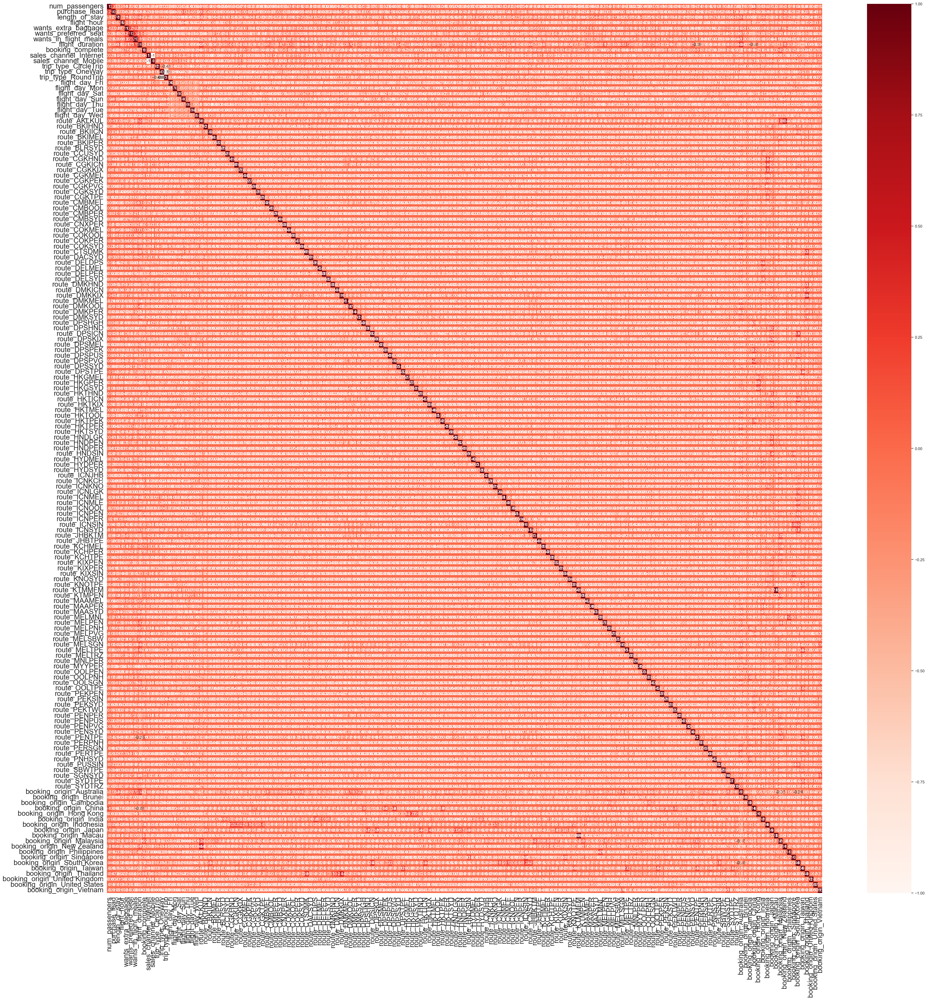

In [36]:
plt.figure(figsize=(45,45))
sns.heatmap(
    correlation,
    xticklabels=correlation.columns.values,
    yticklabels=correlation.columns.values,
    annot=True,
    annot_kws={'size': 12},
    cmap='Reds'
)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

As seen in the heatmap above, there are no features that share the same value. Therefore, we can now further prepare our dataset and proceed to creating the model.

In [37]:
booking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Columns: 163 entries, num_passengers to booking_origin_Vietnam
dtypes: bool(154), float64(1), int64(8)
memory usage: 10.8 MB


## Converting boolean columns to int

It is essential to do since machine learning models only accept numerical values.

In [38]:
#iterate through columns and change all bools to ints
for column in booking.columns:
    if booking[column].dtype == 'bool':
        booking[column] = booking[column].astype('int')

In [39]:
booking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Columns: 163 entries, num_passengers to booking_origin_Vietnam
dtypes: float64(1), int32(154), int64(8)
memory usage: 32.8 MB


In [40]:
booking.head()

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,sales_channel_Internet,...,booking_origin_Malaysia,booking_origin_New Zealand,booking_origin_Philippines,booking_origin_Singapore,booking_origin_South Korea,booking_origin_Taiwan,booking_origin_Thailand,booking_origin_United Kingdom,booking_origin_United States,booking_origin_Vietnam
0,2,262,19,7,1,0,0,5.52,0,1,...,0,1,0,0,0,0,0,0,0,0
1,1,112,20,3,0,0,0,5.52,0,1,...,0,1,0,0,0,0,0,0,0,0
2,2,243,22,17,1,1,0,5.52,0,1,...,0,0,0,0,0,0,0,0,0,0
3,1,96,31,4,0,0,1,5.52,0,1,...,0,1,0,0,0,0,0,0,0,0
4,2,68,22,15,1,0,1,5.52,0,1,...,0,0,0,0,0,0,0,0,0,0


## Model creation

In [41]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, precision_score, recall_score, f1_score
from sklearn import metrics

import warnings
warnings.filterwarnings('ignore', category=UserWarning)

In [42]:
train_df = booking.copy()

## Dropping the predictive model

In [43]:
x = booking.drop('booking_complete', axis=1)
y = booking['booking_complete']

In [44]:
x

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,sales_channel_Internet,sales_channel_Mobile,...,booking_origin_Malaysia,booking_origin_New Zealand,booking_origin_Philippines,booking_origin_Singapore,booking_origin_South Korea,booking_origin_Taiwan,booking_origin_Thailand,booking_origin_United Kingdom,booking_origin_United States,booking_origin_Vietnam
0,2,262,19,7,1,0,0,5.52,1,0,...,0,1,0,0,0,0,0,0,0,0
1,1,112,20,3,0,0,0,5.52,1,0,...,0,1,0,0,0,0,0,0,0,0
2,2,243,22,17,1,1,0,5.52,1,0,...,0,0,0,0,0,0,0,0,0,0
3,1,96,31,4,0,0,1,5.52,1,0,...,0,1,0,0,0,0,0,0,0,0
4,2,68,22,15,1,0,1,5.52,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,27,6,9,1,0,1,5.62,1,0,...,0,0,0,0,0,0,0,0,0,0
49996,1,111,6,4,0,0,0,5.62,1,0,...,0,0,0,0,0,0,0,0,0,0
49997,1,24,6,22,0,0,1,5.62,1,0,...,0,0,0,0,0,0,0,0,0,0
49998,1,15,6,11,1,0,1,5.62,1,0,...,0,0,0,0,0,0,0,0,0,0


In [45]:
y

0        0
1        0
2        0
3        0
4        0
        ..
49995    0
49996    0
49997    0
49998    0
49999    0
Name: booking_complete, Length: 50000, dtype: int64

## Splitting the dataset into training and testing set

In [46]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [47]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(37500, 162)
(12500, 162)
(37500,)
(12500,)


## Building the model

I used `n_estimators=1000`. This means that the random forest will be consisted of 1000 decision trees.

In [48]:
rf_classifier = RandomForestClassifier(n_estimators=1000, criterion='entropy')
rf_classifier.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', n_estimators=1000)

In [49]:
predictions = rf_classifier.predict(x_test)
predictions

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

## Model Evaluation

In evaluating our model, we will use the following metrics
- Accuracy = the ratio of correctly predicted observations to the total observations
- Precision = the ability of the classifier to not label a negative sample as positive
- Recall = the ability of the classifier to find all the positive samples
- ROC & AUC = It tells how much the model is capable of distinguishing between classes.
- K-Fold Cross Validation = how the results of a statistical analysis will generalize to an independent data set.
- F1 Score = the weighted average of Precision and Recall.

The reason why I used these six metrics is because a simple accuracy is not always a good measure to use. To give an example, let's say you're predicting heart failures with patients in a hospital and there were 100 patients out of 1000 that did have a heart failure.

In [68]:
accuracy = accuracy_score(y_test, predictions)
print('Accuracy: {:.1f}%'.format(accuracy * 100))

Accuracy: 85.2%


In [52]:
train_accuracy = rf_classifier.score(x_train, y_train)
test_accuracy = rf_classifier.score(x_test, y_test)

print('Train Accuracy Score: {:.1f}%'.format(train_accuracy * 100))
print('Test Accuracy Score: {:.1f}%'.format(test_accuracy * 100))

Train Accuracy Score: 100.0%
Test Accuracy Score: 85.2%


In [53]:
cf = confusion_matrix(y_test, predictions)
print('Confusion Matrix: \n', cf)

Confusion Matrix: 
 [[10430   218]
 [ 1637   215]]


In [54]:
tp, fp, tn, fn = cf.ravel()

print('True Prositive: ', tp)
print('False Prositive: ', fp)
print('True Negative: ', tn)
print('False Negative: ', fn)

True Prositive:  10430
False Prositive:  218
True Negative:  1637
False Negative:  215


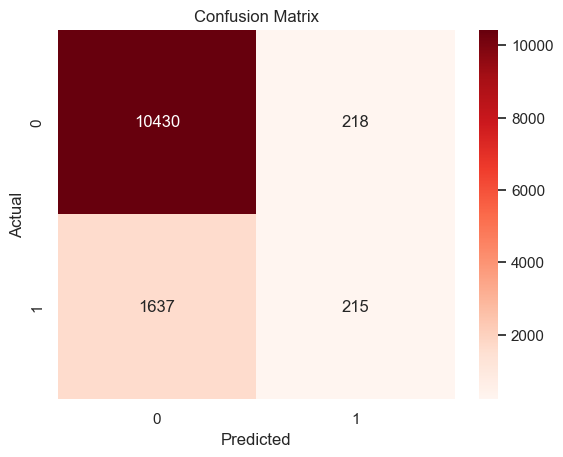

In [55]:
sns.heatmap(cf, annot=True, cmap='Reds', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [56]:
recall = metrics.recall_score(y_test, predictions) * 100
precision = metrics.precision_score(y_test, predictions) * 100
accuracy = metrics.accuracy_score(y_test, predictions) * 100
type_1_err = (fp / (fp + tn)) * 100
type_2_err = (fn / (fn + tp)) * 100

print('Recall: {:.1f}%'.format(recall))
print('Precision: {:.1f}%'.format(precision))
print('Accuracy: {:.1f}%'.format(accuracy))
print('Type I Error: {:.1f}%'.format(type_1_err))
print('Type II Error: {:.1f}%'.format(type_2_err))

Recall: 11.6%
Precision: 49.7%
Accuracy: 85.2%
Type I Error: 11.8%
Type II Error: 2.0%


In [57]:
roc = roc_auc_score(y_test, predictions)
print('ROC AUC Score: {:.1f}%'.format(roc * 100))

ROC AUC Score: 54.8%


In [58]:
f1_score = f1_score(y_test, predictions)
print('F1 Score: {:.1f}%'.format(f1_score * 100))

F1 Score: 18.8%


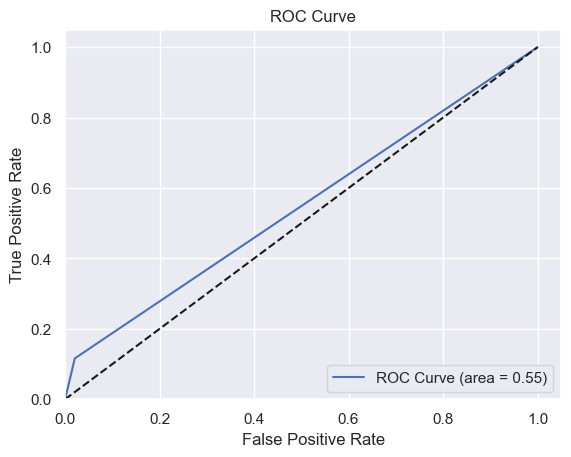

In [59]:
fpr, tpr, thresholds = roc_curve(y_test, predictions)

plt.plot(fpr, tpr, label='ROC Curve (area = %0.2f)' % roc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

In [60]:
from sklearn.model_selection import cross_val_score

In [61]:
cv_scores = cross_val_score(rf_classifier, x_train, y_train, cv=5, scoring='accuracy')
print('Cross Validation Accuracy Scores: {}'.format(cv_scores))

Cross Validation Accuracy Scores: [0.84426667 0.85226667 0.84693333 0.84733333 0.85293333]


In [62]:
print('Average Cross Validation Accuracy Score: {:.1f}%'.format(cv_scores.mean() * 100))

Average Cross Validation Accuracy Score: 84.9%


## Feature Importance

We will see which feature did highly affect in the predictive power of the model.

In [64]:
feature_importances = pd.DataFrame({
    'features': x_train.columns,
    'importance': rf_classifier.feature_importances_
    }).sort_values('importance', ascending=True).reset_index()

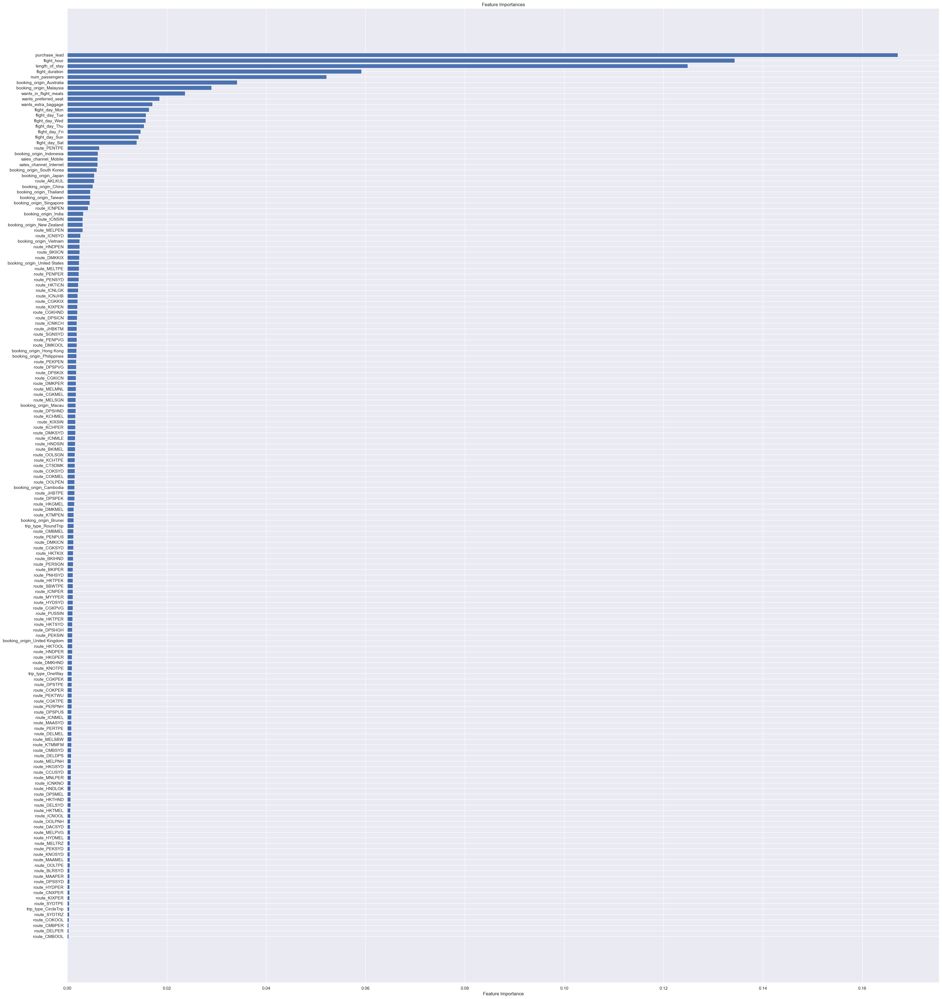

In [66]:
plt.figure(figsize=(40, 45))
plt.title('Feature Importances')
plt.barh(range(len(feature_importances)), feature_importances['importance'], color='b', align='center')
plt.yticks(range(len(feature_importances)), feature_importances['features'])
plt.xlabel('Feature Importance')
plt.show()

As seen in the graph above, the number of days between the booking and the flight made the highest impact in the predictive power of the model. On the other hand, route features and booking origins did not affect much on the model's predictive power.